In [5]:
#| output: false
from Scripts import trape

# Introduction

Our aim is to develop a simple model of the age patterns of clinical malaria under different transmission intensities. This requires high quality, long-term, longitudinal data of frequent and active surveillance of clinical disease in a large cohort of people from birth.

The population of two villages in Senegal — Dielmo since 1990 and Ndiop since 1993 — have been uninterruptedly followed with identical and strict clinical surveillance programs [@trape_1996; @trape_one_2024]. These include daily home visits to each person and the 24h presence of medical teams in the villages. Thus, detection was active and frequent in local settings with fast and accurate diagnosis. 

The data from Dielmo have been published at the population level (total clinical episodes and number of days follow up each year) and at the individual level (clinical episodes and number of days follow up in each of 111 people in age ranges 0y, 1-3y, 4-6y, 7-9y, 10-14y and 15-25y, @trape_one_2024). The data from Ndiop have been published at the population level only [@trape_1996]. 

Dielmo has intense transmission, whereas transmission in Ndiop is less intense.

We first analyse the individual level data of Dielmo to understand inter-person sources of variation. We then analyse the two population level datasets to understand inter-population sources of variation. 


# Individual level data from Dielmo

@trape_one_2024 recorded clinical malaria episodes over 25 years in 111 children in Dielmo village, Senegal; an area with intense transmission. We downloaded data from their [Supplementary Material](https://www.thelancet.com/cms/10.1016/j.eclinm.2023.102379/attachment/f980ad83-707f-40b2-862c-c8d10f17f4ab/mmc1.docx). 

Episodes attributable to *P. falciparum*, *P. malariae*, and *P. ovale* were recorded. Our analysis only considers *P. falciparum* as this was by far the most common species infection. 

The number of clinical episodes and the number of days follow up in age ranges 0y, 1-3y, 4-6y, 7-9y, 10-14y, 15-25y were recorded for every child. We converted these to annual episode rates and plotted in [@fig-dielmo_individuals_by_age] (green lines) ordered by total clinical episodes and grouped by quartile. Average clinical episodes in each quartile are represented by the thick orange lines.

Clinical episodes rise in the first few years of life. This is due to waning protection from maternal antibodies, increasing risk of being bitten as children grow in size (see Figures 1 of @smith_relationships_2004 and @smith_epidemiologic_2006), reduction in fetal haemoglobin and transitioning from a predominantly milk-based diet to a diverse diet. Clinical episodes peak and then decay as natural immunity slowly develops.

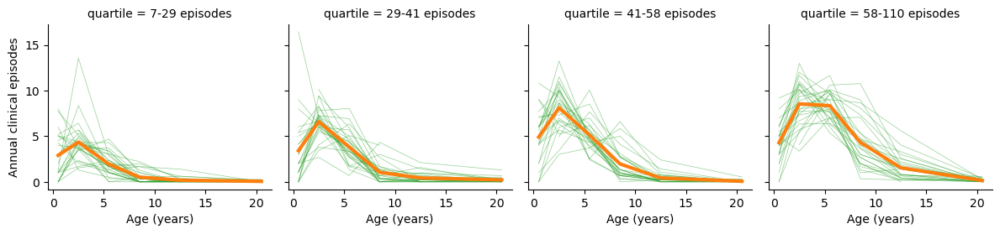

In [6]:
#| label: fig-dielmo_individuals_by_age
#| fig-cap: "Individual-level annual incidence of clinical malaria in 111 people in Dielmo, Senegal from June 1990 to December 2015. Age is stratified by 0y, 1-3y, 4-6y, 7-9y, 10-14y, 15-25y. People have been ordered by their total number of episodes over 25 years and grouped by quartiles. Green lines are individuals, Orange lines are averages within each quartile."

rates_by_age, rates_by_age_longform = trape.individual_episode_data('Data/trape_2024_rates.csv')
g = trape.plot_episodes_by_age(rates_by_age_longform)


Total clinical episodes over 25 years vary from 7 to 110. We want to understand how this variation arises. There are three possible sources of inter-person variation: infection rate, early life protection against infection and development of clinical immunity.

## Variation in bednet use

One source of variation that could impact infection rate is bednet use. @trape_one_2024 scored bednet use on a scale of 0 to 2 for infants, 1-3 year olds and 4-6 year olds. The sum of the scores against total clinical episodes for each person are shown in [@fig-bednet_scores]. 


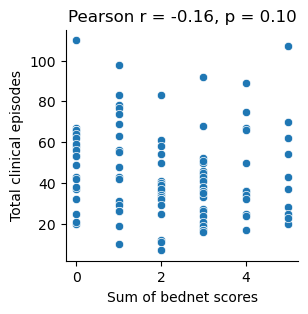

In [7]:
#| label: fig-bednet_scores
#| fig-cap: "Individual sum of bednet scores against total clinical episodes over 25 years. Bednet scores were recorded for infants, 1-3 year olds and 4-6 year olds and scored as 0: no net, 1 net with holes or intermittent use, 2 good quality net use."

fig, ax, r = trape.plot_bednet_scores('Data/trape_2024_bednet_scores.txt', rates_by_age)

There is no correlation between bednet score and total clinical episodes (Pearson-r = `{python} f'{r.statistic:.2f}'`, *p* = `{python} f'{r.pvalue:.2f}'`) hence bednet use explains no variation between the two.

In [8]:
#| output: false

pars_exp = trape.get_mean_pars_exp(51, '../Data_Fitting/Trape/trape1_fit.pickle')
pars_sig = trape.get_mean_pars_sig(51, '../Data_Fitting/Trape/trape2_fit.pickle')
pars_exp = pars_exp._replace(λ=pars_sig.λ, τ_elp=pars_sig.τ_elp, ρ_elp=pars_sig.ρ_elp, ρ_clinical=0.95)

## A simple model of clinical malaria age patterns: Exponential decay in risk

Our model of clinical episode age patterns has two components: decay of early life protection from blood infection and decline in risk of a blood infection causing clinical malaria due to the development of natural immunity. We assume, like others (@penny_public_2016; @rodriguez-barraquer_quantifying_2016; see [Notebook S1](S1_model_summary.ipynb) for our justification), that the decline in risk is directly predicted by the cumulative number of infections. Further determinants, such as age, may be required if we cannot obtain reasonable fits to the data.

We assume that early life protection decays exponentially from a relative risk of $\rho_\text{elp}$ at birth to zero with a half-life of $\tau_\text{elp}$: 

$$\text{Relative protection from blood infection at age $a$} = \rho_\text{elp} \exp\left(-\frac{\ln 2}{\tau_\text{elp}}a\right)$$

Let $\lambda$ be the average annual blood infection rate per child. Then the modified, age-specific infection rate $\lambda^\prime(a)$, is:

$$
\begin{equation}
\lambda^\prime(a) = \lambda \left[1-\rho_\text{elp}\exp\left(-\frac{\ln 2}{\tau_\text{elp}}a\right)\right] \tag{1}
\end{equation}
$${#eq-eq1}

This holds as long as there is either weak seasonality in infection rate, weak seasonality in birth rate or both. If births are correlated with the malaria season then [@eq-eq1] may not apply. @eq-eq1 is illustrated in [@fig-model]A for values of $\lambda =$ `{python} f'{pars_exp.λ:.0f}'` infections per year, $\rho_\text{elp}=$ `{python} f'{pars_exp.ρ_elp:.0f}'` and $\tau_\text{elp}=$ `{python} f'{pars_exp.τ_elp:.1f}'` years. 

The expected number of blood infections by age $a$, $n(a)$, is given by

$$
\begin{equation}
n(a) = \int_0^a \lambda^\prime(a)\,da = \lambda \left[a - \frac{\rho_\text{elp}\tau_\text{elp}}{\ln 2}\left[1-\exp\left(-\frac{\ln 2}{\tau_\text{elp}}a\right)\right]\right] \tag{2}
\end{equation}
$${#eq-eq2}

This is illustrated in [@fig-model]B. 

Our first model of declining risk of clinical malaria with cumulative infections is a simple decaying exponential:

$$
\begin{equation}
\text{Pr(clinical episode on $n^\text{th}$ infection)} = r(n) = \rho_\text{clinical} e^{-\delta_\text{clinical} [n-1]} \tag{3}
\end{equation}
$${#eq-eq3}

where $\rho_\text{clinical}$ is the risk on first infection in non-immune children and $\delta_\text{clinical}$ is the decay rate with the number of infections. This is illustrated in [@fig-model]C with $\rho_\text{clinical} =$ `{python} f'{pars_exp.ρ_clinical:.2f}'` and $\delta_\text{clinical} =$ `{python} f'{pars_exp.δ_clinical:.2f}'` per infection. 

The expected clinical episode rate by age $a$, $c(a)$, is the product of the modified infection rate $\lambda^\prime(a)$, and the risk of the $n^\text{th}$ infection being clinical $r(n(a))$:

$$
\begin{equation}
c(a) = \lambda^\prime(a) r(n(a)) \tag{4}
\end{equation}
$${#eq-eq4}

This is illustrated in [@fig-model]D and shows the typical peak in episodes in early life followed by a gradual decline. 

Finally, the expected cumulative number of clinical episodes by age $a$, $C(0, a)=\int_0^a c(a)\,da$, is illustrated in [@fig-model]E.

Although $C(0, a)$ has an analytical solution it is rather complicated and not given here. The equation for the number of clinical cases between ages $a_1$ and $a_2$, $C(a_1, a_2)=C(0,a_2)-C(0,a_1)$, can be found in [clinical_cases.wlnb](clinical_cases.wlnb) and [Data_Fitting/Trape/trape1.stan](../Data_Fitting/Trape/trape1.stan).

In [9]:
#| output: false

pars_exp = trape.get_mean_pars_exp(51, '../Data_Fitting/Trape/trape1_fit.pickle')
pars_sig = trape.get_mean_pars_sig(51, '../Data_Fitting/Trape/trape2_fit.pickle')
pars_exp = pars_exp._replace(λ=pars_sig.λ, τ_elp=pars_sig.τ_elp, ρ_elp=pars_sig.ρ_elp, ρ_clinical=0.95)
print(pars_exp)

Parameters(λ=16.60684435, ρ_elp=1.0, τ_elp=0.38424341348249996, δ_clinical=0.0207835315825, ρ_clinical=0.95)


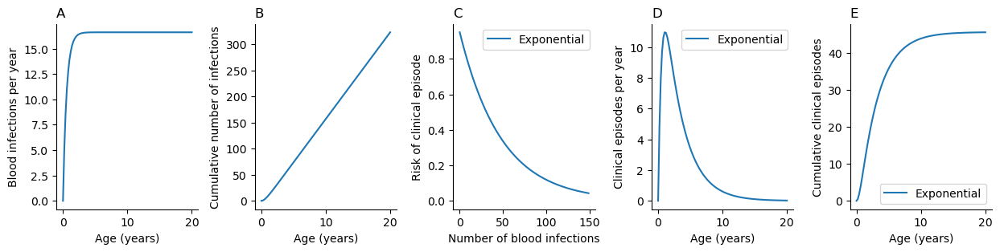

In [10]:
#| label: fig-model
#| fig-cap: "Illustration of the model of clinical episode rate incorporating early-life protection from blood infection and declining risk of clinical malaria with cumulative infections. A) Annual blood infection rate by age (@eq-eq1). B) Expected cumulative number of infections with age (@eq-eq2). C) Risk of clinical malaria with cumulative number of blood infections (@eq-eq3). D) Expected  clinical episode rate per year by age (@eq-eq4). E) Expected cumulative clinical episodes with age. $\\lambda = 17$ blood infections per years, $\\rho_\\text{elp} = 1$, $\\tau_\\text{elp} = 0.4$ years, $\\delta_\\text{clinical} = 0.02$ per infection, $\\rho_\\text{clinical} = 0.95$."

fig, axs = trape.model(pars_exp=pars_exp)

## Likelihood

Let $\theta_i = (\lambda_i, \rho_{\text{elp},i}, \tau_{\text{elp},i}, \rho_{\text{clinical},i}, \delta_{\text{clinical},i})$ be the set of model parameters for each person $i=1,\dots,111$. 

Let $Y_{i}(a_1, a_2)$ be the observed number of clinical episodes of person $i$ between ages $a_1$ and $a_2$, and let $C_{i}(\theta_i, a_1, a_2)$ be the expected number of clinical episodes between ages $a_1$ and $a_2$ predicted by the model. Then $Y_{i}(a_1, a_2)$ is Poisson distributed with parameter $C_{i}(\theta_i, a_1, a_2)$.

## Parameter priors

We initially estimate the model's parameters independently for each individual. In other words, the model is non-hierarchical. We will examine a hierarchical model later.   

### Blood infection rate, $\lambda$

There is no data on blood infection rates in Dielmo - EIR is reported as ~200 [@trape_1996], but this tells us little about blood infection rate. Historical peak clinical attack rate in Dielmo averages about 6-7 per person per year, so average blood infection rate must be higher than this. We initially took a broad normal prior truncated at zero on $\lambda$ of $\mathcal{N}_T(15, 5)$ but discovered identifiability issues with $\delta_\text{clinical}$. We therefore decided to take a narrower prior on $\lambda$ of $\mathcal{N}_T(15, 2)$.

### Protection against infection in newborns, $\rho_\text{elp}$

There is ample evidence that young children are at lower risk of infection due to protection from maternal antibodies and small body surface area. Therefore the probability mass of $\rho_\text{elp}$ should tend towards 1. We therefore chose a prior on $\rho_\text{elp}$ of Beta(5, 1).

### Half-life of early life protection, $\tau_\text{elp}$

Protection from maternal antibodies decays within a few months. Whereas body surface area increases over many years. Thus the half-life of early life protection is likely to be on the scale of several years. We therefore took an exponential prior on $\tau_\text{elp}$ with rate parameter 2 years.

### Risk of clinical malaria in on first infection, $\rho_\text{clinical}$

Reflecting our uncertainty in $\rho_\text{clinical}$, we took a uniform prior from 0 to 1.

### Rate of decay of reduction in risk of clinical malaria, $\delta_\text{clinical}$

For intense transmission, immunity to clinical malaria takes the order of a decade to develop. Therefore children are likely to have experienced on the order of at least 100 blood infections by age 10. This suggests that $\delta_\text{clinical}$ should be on the order of 0.01 per infection. However, there is considerable uncertainty in its value. We therefore took a broad normal prior truncated at zero of $\mathcal{N}_T(0.01, 0.01)$.

### Prior predictive check

Before fitting the model we perform a prior predictive check to check that parameters randomly sampled from the joint prior produce credible clinical age patterns. A random sample of 20 draws shown in [@fig-exp_ppc] produce credible age patterns. 

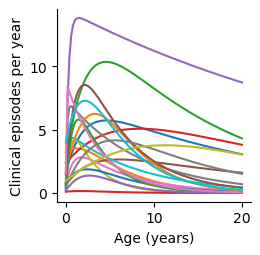

In [11]:
#| label: fig-exp_ppc
#| fig-cap: "Twenty random draws from the joint prior distribution of the exponential model produces credible clinical malaria age patterns."

import numpy as np
from scipy.stats import truncnorm, expon, uniform, beta
N = 20
p = trape.Pars_exp(
    λ = truncnorm.rvs((0 - 15) / 2, np.inf, loc=15, scale=2, size=N).reshape(1, -1),
    ρ_elp = beta.rvs(5, 1, size=N).reshape(1, -1),
    τ_elp = expon.rvs(scale=2, size=N).reshape(1, -1),
    δ_clinical = truncnorm.rvs((0 - 0.01) / 0.01, np.inf, loc=0.01, scale=0.01, size=N).reshape(1, -1),
    ρ_clinical = uniform.rvs(size=N).reshape(1, -1),
)
fig, ax = trape.prior_predictive_check(pars_exp=p)

## Model fit

We fit the model to the data using Hamilton Monte Carlo (HMC) using Stan version 2.3. The Stan model file can be found in [Data_Fitting/Trape/trape1.stan](../Data_Fitting/Trape/trape1.stan) and the fit diagnostics can be found in [Data_Fitting/Trape/trape1.ipynb](../Data_Fitting/Trape/trape1.ipynb).

The predicted age patterns averaged across people stratified by total episode quartiles are shown in [@fig-trape_fit_episodes_by_age_exp]. Although the model captures the overall shape, it is over-estimating clinical episodes in the first year of life then under-estimating in the 1-9 year olds, then over-estimating in the over tens.

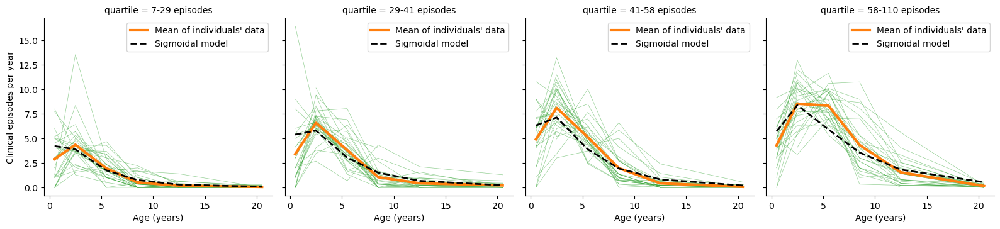

In [12]:
#| label: fig-trape_fit_episodes_by_age_exp
#| fig-cap: "Exponential, non-hierarchical model fitted to individual-level clinical malaria episodes in 111 people stratified by total episode quartiles. Green lines are individuals, orange lines are averages within each quartile, black dashed lines are the exponential, non-hierarchical model predictions averaged over the people in each quartile."

trape.plot_fit_episodes_by_age(rates_by_age_longform, sig_file='../Data_Fitting/Trape/trape1_draws.csv')

## Attempt two: Sigmoidal decay in risk

Given the poor fit of the exponential model, we sought a more flexible model. We next tried a sigmoidal decay in risk of clinical malaria with cumulative number of infections. This can have an initial slower rate of decline than the exponential model, as demonstrated in [@fig-model_both]C.

The form of the sigmoidal model is

$$\text{Pr(clinical episode on $n^\text{th}$ infection)} = r(n) = \rho_\text{clinical}\frac{e^{\delta_\text{clinical}[\gamma_\text{clinical}-1]}-1}{e^{\delta_\text{clinical}[\gamma_\text{clinical}-1]}-2+e^{\delta_\text{clinical}[n-1]}}$$

which equals $\rho_\text{clinical}$ when $n=1$ and $\frac{\rho_\text{clinical}}{2}$ when $n=\gamma_\text{clinical}$.

This model has an additional parameter $\gamma_\text{clinical}$ which is the number of infections at half-maximum-risk.

The number of clinical cases between ages $a_1$ and $a_2$, $C(a_1, a_2)$, can be found in [clinical_cases.wlnb](clinical_cases.wlnb).

This model results in slightly different age patterns for clinical episode rates and cumulative episodes [@fig-model_both]D,E.

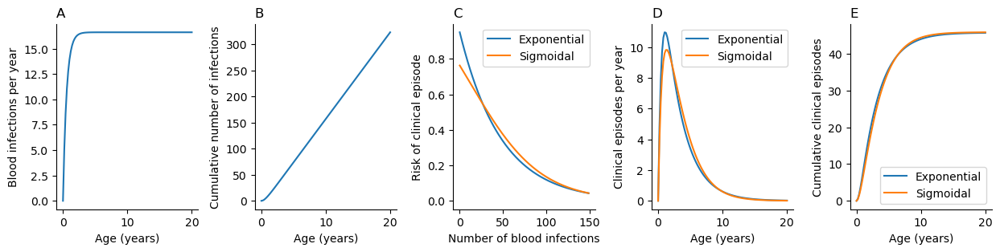

In [13]:
#| label: fig-model_both
#| fig-cap: "Comparison of exponential and sigmoidal model behaviour. Exponential model parameters are the same as in @fig-model. The sigmoidal model parameters are $\\delta_\\text{clinical} = 0.024$ per infection, $\\rho_\\text{clinical} = 0.76$, $\\gamma_\\text{clinical} = 49$ infections."

fig, axs = trape.model(pars_exp=pars_exp, pars_sig=pars_sig)

We expect $\gamma_\text{clinical}$ to be of the order of 100 with wide uncertainty in its value. We therefore took a broad normal prior truncated at zero of $\mathcal{N}_T(100, 50)$. A prior predictive check produces credible age patterns ([@fig-sig_ppc]). 

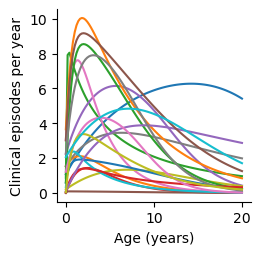

In [14]:
#| label: fig-sig_ppc
#| fig-cap: "Twenty random draws from the joint prior distribution of the sigmoidal model produces credible clinical malaria age patterns."

from scipy.stats import truncnorm, expon, uniform, beta
import numpy as np
N = 20,
p = trape.Pars_sig(
    λ = truncnorm.rvs((0 - 15) / 2, np.inf, loc=15, scale=2, size=N).reshape(1, -1),
    ρ_elp = beta.rvs(5, 1, size=N).reshape(1, -1),
    τ_elp = expon.rvs(scale=2, size=N).reshape(1, -1),
    δ_clinical = truncnorm.rvs((0 - 0.01) / 0.01, np.inf, loc=0.01, scale=0.01, size=N).reshape(1, -1),
    ρ_clinical = uniform.rvs(size=N).reshape(1, -1),
    γ_clinical = truncnorm.rvs((0 - 100) / 50, np.inf, loc=100, scale=50, size=N).reshape(1, -1),
)
fig, ax = trape.prior_predictive_check(pars_sig=p)

## Model fit

Again we use a non-hierarchical model; fitting the parameters independently to each individual. (The Stan model file can be found in [Data_Fitting/Trape/trape2.stan](../Data_Fitting/Trape/trape2.stan) and the fit diagnostics can be found in [Data_Fitting/Trape/trape2.ipynb](../Data_Fitting/Trape/trape2.ipynb)). 

The sigmoidal model gives a slightly better fit to clinical age patterns ([@fig-trape_fit_episodes_by_age_sig]).

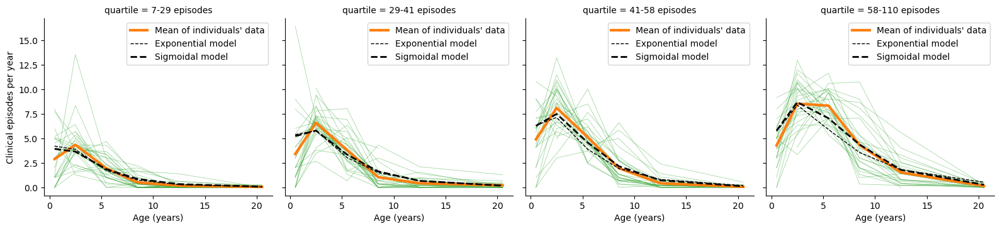

In [15]:
#| label: fig-trape_fit_episodes_by_age_sig
#| fig-cap: "Sigmoidal, non-hierarchical model fitted to individual-level clinical malaria episodes in 111 people stratified by total episode quartiles (dashed lines). Exponential model fit shown for comparison (dotted lines)."

g = trape.plot_fit_episodes_by_age(rates_by_age_longform, exp_file='../Data_Fitting/Trape/trape1_draws.csv', sig_file='../Data_Fitting/Trape/trape2_draws.csv')

In [16]:
#| output: false

models = 'exp non-hierarchical', 'sig non-hierarchical', 'sig non-hierarchical rho_elp=1', 'sig hierarchical rho_elp=1', 'exp hierarchical rho_elp=1'
files = '../Data_Fitting/Trape/trape1_fit.pickle', '../Data_Fitting/Trape/trape2_fit.pickle', '../Data_Fitting/Trape/trape3_fit.pickle', '../Data_Fitting/Trape/trape4_fit.pickle', '../Data_Fitting/Trape/trape5_fit.pickle'
loo_ind = trape.loocv(models, files)
loo_ind

,rank,elpd_loo,p_loo
sig hierarchical rho_elp=1,0,-1534.625516,293.383719
sig non-hierarchical rho_elp=1,1,-1614.001903,327.310523
exp hierarchical rho_elp=1,2,-1634.018868,277.510187
sig non-hierarchical,3,-1636.804617,336.608681
exp non-hierarchical,4,-1721.672991,330.883368


Model prediction accuracy, assessed with Bayesian leave-one-out estimates of out-of-sample predictive fits ([@tbl-loo_ind]) strongly supports the non-hierarchical, sigmoidal model over the non-hierarchical, exponential model.

Model | Hierarchical | $\rho_\text{elp}$ | elpd~loo~
:-- | :-- | :-: | :-:
Sigmoidal   |     Hierarchical | 1 | `{python} f"{loo_ind.loc['sig hierarchical rho_elp=1', 'elpd_loo']:.0f}"`
Sigmoidal   | Non-Hierarchical | 1 | `{python} f"{loo_ind.loc['sig non-hierarchical rho_elp=1', 'elpd_loo']:.0f}"`
Exponential |     Hierarchical | 1 | `{python} f"{loo_ind.loc['exp hierarchical rho_elp=1', 'elpd_loo']:.0f}"`
Sigmoidal   | Non-hierarchical | Estimated | `{python} f"{loo_ind.loc['sig non-hierarchical', 'elpd_loo']:.0f}"`
Exponential | Non-hierarchical | Estimated | `{python} f"{loo_ind.loc['exp non-hierarchical', 'elpd_loo']:.0f}"`

: Predictive accuracy of the individual-level models. {#tbl-loo_ind}

### Relationship between model parameters and total clinical episodes

The marginal posterior estimates for each parameter for each person of the sigmoidal model are shown in [@fig-parameter_relationships].

We expected there to be a positive relationship between infection rate, $\lambda$ and total clinical episodes over 25 years ([@fig-parameter_relationships]A). In fact, the model suggests that the infection rate a person experiences does not predict their total clinical episodes. Note that this does not imply that the average infection rate experienced by a population does not predict average total clinical episodes in that population - it is reasonable to expect more clinical episodes per person in a population experiencing a high infection rate than a low rate. Moreover, the model fit does not rule out inter-person variation in infection rate. It is just that the data are insufficient to resolve any such variation given the model. The predicted average infection rate is `{python} f'{pars_sig.λ:.1f}'` infections per person per year.

The marginal distributions of $\rho_\text{elp}$ are very similar to the prior distribution, Beta(5, 1). This means the data does not update our prior uncertainty in this parameter. Refitting the model with $\rho_\text{elp}=1$ ([Data_Fitting/Trape/trape3.stan](../Data_Fitting/Trape/trape3.stan)) gives an identical fit and a higher predictive accuracy (`{python} f"{loo_ind.loc['sig non-hierarchical rho_elp=1', 'elpd_loo']:.0f}"` vs. `{python} f"{loo_ind.loc['sig non-hierarchical', 'elpd_loo']:.0f}"`; [@tbl-loo_ind]).

The marginal distributions of $\tau_\text{elp}$ are similar across all people with an average of `{python} f'{pars_sig.τ_elp:.2f}'` years. 

The marginal distributions of $\delta_\text{clinical}$ are also similar across all people with an average of `{python} f'{pars_sig.δ_clinical:.2f}'` per infection. 


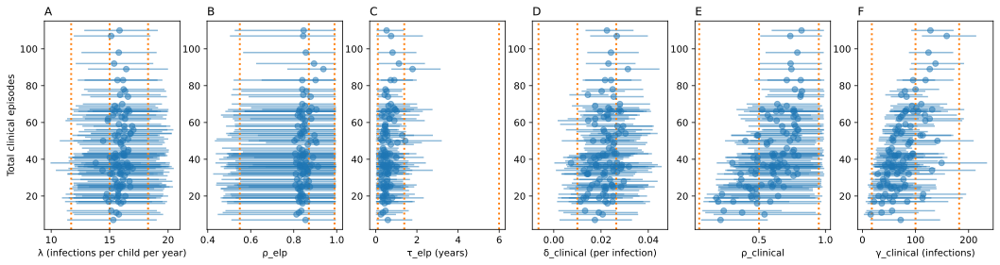

In [13]:
#| label: fig-parameter_relationships
#| fig-cap: "Relationships between total clinical episodes over 25 years against individual marginal posterior parameter estimates for the non-hierarchical, sigmoidal model. Blue dots are posterior means, blue horizontal lines are 95% credible intervals, orange dashed lines are the prior 5th percentile, the mean and the 95th percentile."

fig, axs = trape.parameter_relationships(rates_by_age, sig_file='../Data_Fitting/Trape/trape2_draws.csv')

## Attempt three: Sigmoidal, hierarchical model

Before discussing the other parameters, we fit a hierarchical model with hyperpriors on $\tau_\text{elp}$ and $\delta_\text{clinical}$. (We also tried hyperpriors on $\lambda$ but Stan was unable to sample the posterior.) The Stan model file can be found in [Data_Fitting/Trape/trape4.stan](../Data_Fitting/Trape/trape4.stan) and the fit diagnostics can be found in [Data_Fitting/Trape/trape4.ipynb](../Data_Fitting/Trape/trape4.ipynb)). 

The hierarchical model fit is substantially improved compared to the non-hierarchical model, as shown in [@fig-trape_fit_episodes_by_age_sig_hierarchical]. And the predictive accuracy is significantly higher (`{python} f"{loo_ind.loc['sig hierarchical rho_elp=1', 'elpd_loo']:.0f}"` vs. `{python} f"{loo_ind.loc['sig non-hierarchical rho_elp=1', 'elpd_loo']:.0f}"`; [@tbl-loo_ind]).

As a check we also fitted an exponential, hierarchical model but this performed poorly (`{python} f"{loo_ind.loc['exp hierarchical rho_elp=1', 'elpd_loo']:.0f}"` vs. `{python} f"{loo_ind.loc['sig hierarchical rho_elp=1', 'elpd_loo']:.0f}"`; [@tbl-loo_ind]; Stan model file can be found in [Data_Fitting/Trape/trape5.stan](../Data_Fitting/Trape/trape5.stan) and the fit diagnostics can be found in [Data_Fitting/Trape/trape5.ipynb](../Data_Fitting/Trape/trape5.ipynb)). and won't be considered further.

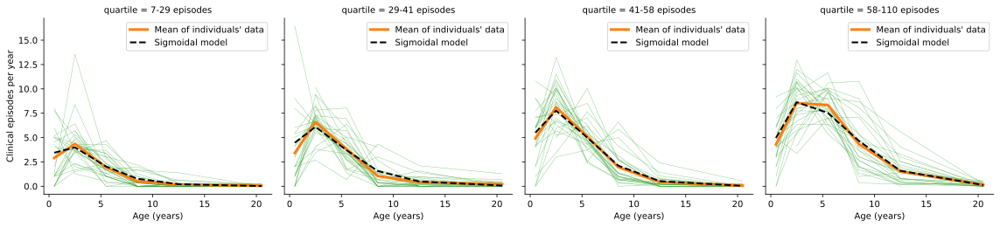

In [14]:
#| label: fig-trape_fit_episodes_by_age_sig_hierarchical
#| fig-cap: "Sigmoidal, hierarchical model fitted to individual-level clinical malaria episodes in 111 people stratified by total episode quartiles. "

trape.plot_fit_episodes_by_age(rates_by_age_longform, sig_file='../Data_Fitting/Trape/trape4_draws.csv')

The marginal posterior estimates for each parameter for each person of the sigmoidal model are shown in [@fig-parameter_relationships_hierarchical].

Most of the variation in total clinical episodes appears to be explained by variation in two parameters: $\rho_\text{clinical}$, the risk of a blood infection becoming clinical on first infection, and $\gamma_\text{clinical}$, the number of infections at half-maximum-risk. The results suggest that children who experienced the most clinical episodes have high values of both. That is they appear to have both a higher susceptibility to clinical malaria, and they require more infections to develop the same level of immunity as children who experienced fewer clinical episodes.

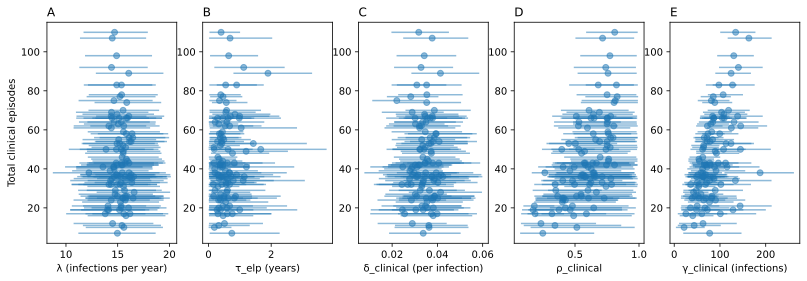

In [15]:
#| label: fig-parameter_relationships_hierarchical
#| fig-cap: "Relationships between total clinical episodes over 25 years against individual marginal posterior parameter estimates for the hierarchical, sigmoidal model. Blue dots are posterior means, blue horizontal lines are 95% credible intervals, orange dashed lines are the prior 5th percentile, the mean and the 95th percentile."

fig, axs = trape.parameter_relationships_hierarchical(rates_by_age, sig_file='../Data_Fitting/Trape/trape4_draws.csv')

The individual predicted age patterns are shown in [@fig-individual_risk_profiles]. Blood infection rates rise in early life ([@fig-individual_risk_profiles]A). Because the children are predicted to experience a similar infection rate ($\lambda$) and have similar early life protection half-lives, ($\tau_\text{elp}$), there is little variability in these curves. There is considerable variation in the risk of clinical malaria with the cumulative number of blood infections ([@fig-individual_risk_profiles]B). Children with fewer total infections over 25 years (dark lines) have lower risk on first infection, $\rho_\text{clinical}$, and lower infections at half-maximum-risk, $\gamma_\text{clinical}$. The products of the curves in A and B give the clinical age pattern curves in C. 

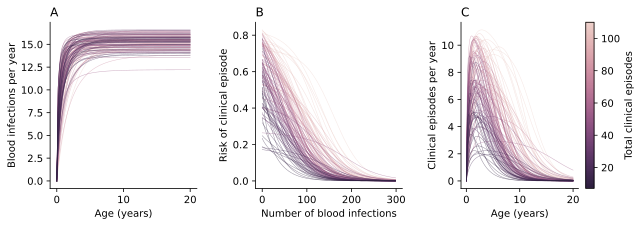

In [16]:
#| label: fig-individual_risk_profiles
#| fig-cap: "Individual risk profiles for the hierarchical sigmoidal model. Each line is A) the predicted blood infection rate with age, B) the predicted risk of clinical malaria against the number of blood infections and C) the predicted clinical episode rate by age. Lines are coloured by their total number of episodes over 25 years."

fig, axs = trape.plot_individual_risk_profiles('../Data_Fitting/Trape/trape4_draws.csv')

# Population level data from Dielmo and Ndiop

Our model is population-based rather than individual-based. We therefore need a model to describe clinical age patterns at the population level. Heterogeneous clinical age patterns at the individual level may have a different shape when averaged over. Thus different models may be needed to describe individual and population age patterns. We will first fit the sigmoidal model to population level data to see if a different model is necessary. 

For the 111 Dielmo participants, age-stratified number of malaria episodes were extracted from Figure 1 of @trape_one_2024, and age-stratified person-days at risk were extracted from Supplementary Table 1 of @trape_one_2024. For Ndiop, age-stratified malaria episode rates were extracted from Figure 2A of @trape_1996. To fit a model simultaneously to the data from the two villages requires the number of yearly episodes in each age group, rather than clinical episode rate. As this information was unavailable for Ndiop we assumed that the number of people sampled in Ndiop was the same as in Dielmo, i.e., 111 people. We then multiplied the episode rates by 111 and rounded to the nearest integer. We stratified age in 1-year intervals from 0 to 14, and grouped episodes for 15-25 year olds. The annual clinical episode rates for the two villages are shown in [@fig-population_episodes_by_age]. Note the last data points are for ages 15-25 years, whereas all the others are for each year of age. 

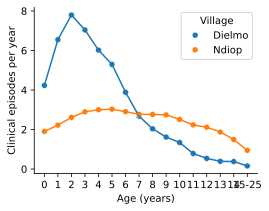

In [17]:
#| label: fig-population_episodes_by_age
#| fig-cap: "Age patterns of annual clinical malaria episode rates in Dielmo and Ndiop villages in Senegal. Data extracted from Figure 1 of @trape_one_2024 and Figure 2a of @trape_1996."

fig, ax = trape.plot_population_episodes_by_age('Data/trape_site_rates.csv')

## Model fit

We fit the parameters $\lambda$, $\tau_\text{elp}$, $\rho_\text{clinical}$, $\delta_\text{clinical}$ and $\gamma_\text{clinical}$, independently to each villages' data using the same likelihood and priors as for the individual level data. With one exception; the prior on $\lambda$ for Ndiop is taken as $\mathcal{N}_T(5, 2)$ reflecting its lower transmission intensity. The Stan file for the sigmoidal model is [Data_Fitting/Trape/trape6.stan](../Data_Fitting/Trape/trape6.stan) and the fit diagnostics are in  [Data_Fitting/Trape/trape6.ipynb](../Data_Fitting/Trape/trape6.ipynb).

The fit of the model to both villages' data is excellent and shown in [@fig-population_fit_hetero]. For comparison, a prediction using the means of the marginal posterior parameter estimates of the individual-level model ([@fig-parameter_relationships_hierarchical]) is shown as the red dashed line. They are very similar which suggests that the sigmoidal model is appropriate for describing both individual and population level data.

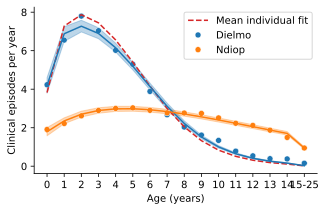

In [18]:
#| label: fig-population_fit_hetero
#| fig-cap: "Fit of the clinical episode rate model to age-stratified data from Dielmo and Ndiop villages. Circles are observed annual clinical episode rates. Posterior mean age patterns and their 95% credible intervals are represented by the lines and shaded regions. The red dashed line is the prediction using the mean parameter estimates from the fit to the individual-level data of Dielmo village ([@fig-parameter_relationships_hierarchical])."

pars_dielmo, pars_ndiop, df = trape.get_population_pars_hetero('../Data_Fitting/Trape/trape6_draws.csv')
fig, axs = trape.fit_pop_model(pars_dielmo, pars_ndiop, '../Data_Fitting/Trape/trape4_fit.pickle', 'Data/trape_site_rates.csv')

Pairwise marginal posterior densities for Dielmo are shown in [@fig-marginal_posteriors]. It shows obvious identifiability problems for many of the parameters as we might expect for non-linear regression. This results in rather imprecise estimates of the parameters as shown in the top row of [@fig-population_parameter_distributions].

In [19]:
#| label: fig-marginal_posteriors
#| fig-cap: "Pairwise marginal posterior densities of the population-level model of Dielmo."

g = trape.plot_marginal_posterior('../Data_Fitting/Trape/trape6_draws.csv')

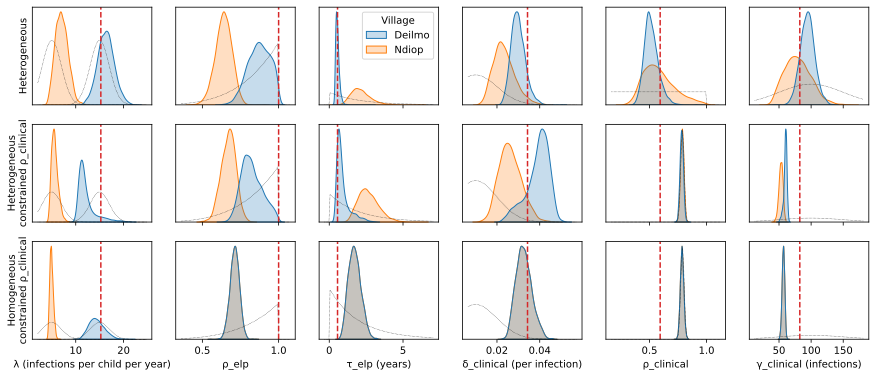

In [20]:
#| label: fig-population_parameter_distributions
#| fig-cap: "Marginal posterior distributions of population-level model parameters for Dielmo (blue) and Ndiop (orange). Top row: heterogeneous parameters (i.e., parameters fitted independently to each village). Middle row: heterogeneous parameters with a narrow prior on $\\rho_\\text{clinical}$ estimated from @goncalves_parasite_2014. Bottom row: homogeneous parameters on both villages and a narrow prior on $\\rho_\\text{clinical}$. Red dashed lines are mean estimates from the individual-level model. Black dotted lines are the prior distributions."

fig, axs = trape.plot_pop_parameter_distributions('../Data_Fitting/Trape/trape6_draws.csv', '../Data_Fitting/Trape/trape7_draws.csv', '../Data_Fitting/Trape/trape8_draws.csv', '../Data_Fitting/Trape/trape4_fit.pickle')

In [21]:
from Scripts import goncalves
p = goncalves.get_estimates('../Data_Fitting/Goncalves/goncalves1_draws.csv')

To reduce the variation in the parameter estimates we can make use of the estimate of $\rho_\text{clinical}$ from our analysis of @goncalves_parasite_2014 (see [Notebook S4](S4_goncalves.ipynb)). We estimated this parameter quite precisely to be `{python} f'{p.P_fever.mean():.3f}'` $\pm$ `{python} f'{p.P_fever.std():.3f}'`. We use this estimate as a prior on $\rho_\text{clinical}$ when fitting to the Dielmo and Ndiop population-level clinical rates. The Stan model file is [Data_Fitting/Trape/trape7.stan](../Data_Fitting/Trape/trape7.stan) and the fit diagnostics are in [Data_Fitting/Trape/trape7.ipynb](../Data_Fitting/Trape/trape7.ipynb). 

The marginal parameter estimates for this model are shown in the middle row of [@fig-population_parameter_distributions]. The parameters $\rho_\text{clinical}$ and $\gamma_\text{clinical}$ are now more precisely defined, but the other parameters are still rather imprecise.

The substantial overlap in the marginal posteriors between the two villages suggest we might be able to treat all parameters, except $\lambda$, as homogeneous. We therefore fitted a model with all parameters homogeneous (except $\lambda$). The Stan model file is [Data_Fitting/Trape/trape8.stan](../Data_Fitting/Trape/trape8.stan) and the fit diagnostics are in [Data_Fitting/Trape/trape8.ipynb](../Data_Fitting/Trape/trape8.ipynb). 

This results in far more precise estimates for all parameters as shown in the bottom row of [@fig-population_parameter_distributions]. The fit of the model to the clinical age patterns is still good ([@fig-population_fit_homo]).

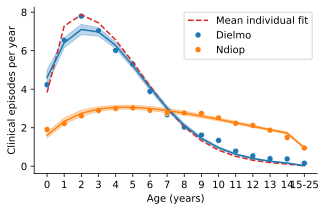

In [22]:
#| label: fig-population_fit_homo
#| fig-cap: "Fit of the homogeneous model to age-stratified clinical episode data from Dielmo and Ndiop. Circles are observed yearly clinical episode rates. The posterior means and their 95% credible intervals are represented by the lines and shaded regions. The red dashed line is the prediction using using the means of the mean marginal posterior parameter estimates of the individual-level model ([@fig-parameter_relationships_hierarchical])."

pars_dielmo, pars_ndiop, df = trape.get_population_pars_homo('../Data_Fitting/Trape/trape8_draws.csv')
fig, axs = trape.fit_pop_model(pars_dielmo, pars_ndiop, '../Data_Fitting/Trape/trape4_fit.pickle', 'Data/trape_site_rates.csv')

In [23]:
#| output: false
models = 'hetero6', 'hetero7', 'homo'
files = '../Data_Fitting/Trape/trape6_fit.pickle', '../Data_Fitting/Trape/trape7_fit.pickle', '../Data_Fitting/Trape/trape8_fit.pickle'
loo_pop = trape.loocv(models, files)
loo_pop

,rank,elpd_loo,p_loo
hetero6,0,-179.344501,23.927827
hetero7,1,-183.456442,27.320047
homo,2,-188.902621,27.202841


Although, the predictive accuracy is slightly worse ([@tbl-loo_pop]).

Model | $\rho_\text{clinical}$ prior | elpd~loo~
:-- | :-: | :-:
Heterogeneous | $\mathcal{U}(0,1)$ | `{python} f"{loo_pop.loc['hetero6', 'elpd_loo']:.0f}"`
Heterogeneous | $\mathcal{N}$ (`{python} f'{p.P_fever.mean():.3f}'`, `{python} f'{p.P_fever.std():.3f}'`) | `{python} f"{loo_pop.loc['hetero7', 'elpd_loo']:.0f}"`
Homogeneous |   $\mathcal{N}$ (`{python} f'{p.P_fever.mean():.3f}'`, `{python} f'{p.P_fever.std():.3f}'`) | `{python} f"{loo_pop.loc['homo', 'elpd_loo']:.0f}"`

: Predictive accuracy of population-level models. {#tbl-loo_pop}

Therefore we can conclude that early life protection and clinical immunity parameters can be treated as homogeneous across these two villages. Whether this is true more generally requires high quality data from other sites.


In [24]:
#| output: false

means, stds = trape.get_estimates('../Data_Fitting/Trape/trape8_draws.csv')
print(means)
print(stds)

lambda[1]         14.408940
lambda[2]          4.958249
rho_elp            0.712397
tau_elp            1.729782
delta_clinical     0.032634
rho_clinical       0.785443
gamma_clinical    56.895074
dtype: float64
lambda[1]         1.598216
lambda[2]         0.370569
rho_elp           0.030709
tau_elp           0.418399
delta_clinical    0.003657
rho_clinical      0.015413
gamma_clinical    2.051553
dtype: float64


The parameters used in our model are given in [@tbl-pop_estimates].

Parameter | Estimate | Units
:-- | --: | --:
$\rho_\text{elp}$        | `{python} f'{means["rho_elp"]:.2g} ± {stds["rho_elp"]:.2g}'` |
$\tau_\text{elp}$        | `{python} f'{means["tau_elp"]:.2g} ± {stds["tau_elp"]:.2g}'` | year
$\rho_\text{clinical}$   | `{python} f'{means["rho_clinical"]:.2g} ± {stds["rho_clinical"]:.2g}'` |
$\delta_\text{clinical}$ | `{python} f'{means["delta_clinical"]:.2g} ± {stds["delta_clinical"]:.2g}'` | per infection
$\gamma_\text{clinical}$ | `{python} f'{means["gamma_clinical"]:.2g} ± {stds["gamma_clinical"]:.2g}'` | infection

: Population-level parameter estimates (Mean ± standard error). {#tbl-pop_estimates}


# Conclusion

In conclusion, we have simple, credible models of early life protection and clinical immunity that fit high quality, individual and population clinical age pattern data extremely well. We find that heterogeneity in total clinical episodes is driven by heterogeneity in susceptibility to clinical malaria and heterogeneity in how rapidly children develop clinical immunity with exposure to blood infection. We find that difference in population-level clinical episode age patterns can be explained simply by heterogeneity in average annual blood infection rate; early life protection and clinical immunity parameters are homogeneous between the villages.

::: {#refs}
:::